In [1]:
# Librerias
import itertools # Generar combinaciones
import numpy as np # Trabajar con arrays 
import time # Cronometrizar la ejecución de determinados algoritmos
from collections import Counter 
from tabulate import tabulate # Para visualización de datos
from scipy.optimize import curve_fit #libreria para ajustar curvas.
from codigoPython import * # Codigo base de python donde se contruyen funciones a utilizar 

# Miniproyecto 1. César Antonio Hoyos Peláez

## Punto 1: 

Considere inicialmente el problema de contar microestados, esto es conocer la dimensión de la suma que aparece en la expresión de la función partición canónica. 

$$Z (\beta) = \sum_r exp(- \beta E_r(N))$$

para un modelo de Ising 2D donde los espines pueden estar en dos estados posibles $|\uparrow >$ o $|\downarrow >$. Escriba un programa para obtener todos los posibles microestados con sus correspondientes valores de energía según el siguiente Hamiltoniano de interacciones entre espínes de primeros vecinos (con integral de intercambio $J = 1$). 

$$ H = - \sum_{<k,l>} \sigma_k \sigma_l$$

Para sistemas N = 2x2, 4x4, 6x6, etc. con condiciones de frontera periódicas (p.b.c). 

### Sistema $N = 2x2 $

In [2]:
matrices2 = generar_matrices_espines(2) # se generan combinaciones posibles
energia2 = list(map(energia_por_microestado, matrices2)) # se itera sobre las matrices aplicando la funcion energia_por_microestado
tabla(matrices2, energia2) # Proceso de visualización

╒════════════════╤═══════════╕
│ Micro-estado   │   Energia │
╞════════════════╪═══════════╡
│ [1  1          │        -8 │
│ 1  1]          │           │
├────────────────┼───────────┤
│ [1  1          │         0 │
│ 1  -1]         │           │
├────────────────┼───────────┤
│ [1  1          │         0 │
│ -1  1]         │           │
├────────────────┼───────────┤
│ [1  1          │         0 │
│ -1  -1]        │           │
├────────────────┼───────────┤
│ [1  -1         │         0 │
│ 1  1]          │           │
├────────────────┼───────────┤
│ [1  -1         │         0 │
│ 1  -1]         │           │
├────────────────┼───────────┤
│ [1  -1         │         8 │
│ -1  1]         │           │
├────────────────┼───────────┤
│ [1  -1         │         0 │
│ -1  -1]        │           │
├────────────────┼───────────┤
│ [-1  1         │         0 │
│ 1  1]          │           │
├────────────────┼───────────┤
│ [-1  1         │         8 │
│ 1  -1]         │           │
├───────

### Sistema $ N = 3x3$ 

In [3]:
matrices3 = generar_matrices_espines(3) 
energia3 = list(map(energia_por_microestado, matrices3))
tabla(matrices3, energia3)

╒════════════════╤═══════════╕
│ Micro-estado   │   Energia │
╞════════════════╪═══════════╡
│ [1  1  1       │       -18 │
│ 1  1  1        │           │
│ 1  1  1]       │           │
├────────────────┼───────────┤
│ [1  1  1       │       -10 │
│ 1  1  1        │           │
│ 1  1  -1]      │           │
├────────────────┼───────────┤
│ [1  1  1       │       -10 │
│ 1  1  1        │           │
│ 1  -1  1]      │           │
├────────────────┼───────────┤
│ [1  1  1       │        -6 │
│ 1  1  1        │           │
│ 1  -1  -1]     │           │
├────────────────┼───────────┤
│ [1  1  1       │       -10 │
│ 1  1  1        │           │
│ -1  1  1]      │           │
├────────────────┼───────────┤
│ [1  1  1       │        -6 │
│ 1  1  1        │           │
│ -1  1  -1]     │           │
├────────────────┼───────────┤
│ [1  1  1       │        -6 │
│ 1  1  1        │           │
│ -1  -1  1]     │           │
├────────────────┼───────────┤
│ [1  1  1       │        -6 │
│ 1  1  

### Sistema $N = 4x4$

In [4]:
matrices4 = generar_matrices_espines(4) 
energia4 = list(map(energia_por_microestado, matrices4))
tabla(matrices4, energia4)

╒═════════════════╤═══════════╕
│ Micro-estado    │   Energia │
╞═════════════════╪═══════════╡
│ [1  1  1  1     │       -32 │
│ 1  1  1  1      │           │
│ 1  1  1  1      │           │
│ 1  1  1  1]     │           │
├─────────────────┼───────────┤
│ [1  1  1  1     │       -24 │
│ 1  1  1  1      │           │
│ 1  1  1  1      │           │
│ 1  1  1  -1]    │           │
├─────────────────┼───────────┤
│ [1  1  1  1     │       -24 │
│ 1  1  1  1      │           │
│ 1  1  1  1      │           │
│ 1  1  -1  1]    │           │
├─────────────────┼───────────┤
│ [1  1  1  1     │       -20 │
│ 1  1  1  1      │           │
│ 1  1  1  1      │           │
│ 1  1  -1  -1]   │           │
├─────────────────┼───────────┤
│ [1  1  1  1     │       -24 │
│ 1  1  1  1      │           │
│ 1  1  1  1      │           │
│ 1  -1  1  1]    │           │
├─────────────────┼───────────┤
│ [1  1  1  1     │       -16 │
│ 1  1  1  1      │           │
│ 1  1  1  1      │           │
│ 1  -1 

### Sistema $N = 5x5$

Mi computador permite el calculo de $N = 5x5$ pero imprimir en consola todas las posibles configuraciones se hace muy costoso computacionalmente.  

In [5]:
matrices5 = generar_matrices_espines(5) 
energia5 = list(map(energia_por_microestado, matrices5))

## Punto #2

Calcule la densidad de estados $\Omega(E)$ agrupando los microestados por cantidad según el valor de energía (degenerancia). Construya gráficos de $\Omega(E)$ vs $E$ para al menos diez valores diferentes de $N$, ajústelos a una Gaussiana e infiera el comportamiento de la desviación estándar de las gaussianas en función de $N$. ¿Qué concluye?

In [6]:
dicc2 = densidad_estados(energia2) # Para sistema N = 2x2
dicc3 = densidad_estados(energia3) # Para sistema N = 3x3
dicc4 = densidad_estados(energia4) # Para sistema N = 4x4
dicc5 = densidad_estados(energia5) # Para sistema N = 5x5

  Energia    Numero de Microestados
---------  ------------------------
       -8                         2
        0                        12
        8                         2
  Energia    Numero de Microestados
---------  ------------------------
      -18                         2
      -10                        18
       -6                        48
       -2                       198
        2                       144
        6                       102
  Energia    Numero de Microestados
---------  ------------------------
      -32                         2
      -24                        32
      -20                        64
      -16                       424
      -12                      1728
       -8                      6688
        0                     20524
       -4                     13568
        4                     13568
        8                      6688
       16                       424
       12                      1728
       24                   

c:\Users\Lenovo\Desktop\curso_python\FISICA ESTADISTICA\venv\lib\site-packages\scipy\optimize\_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


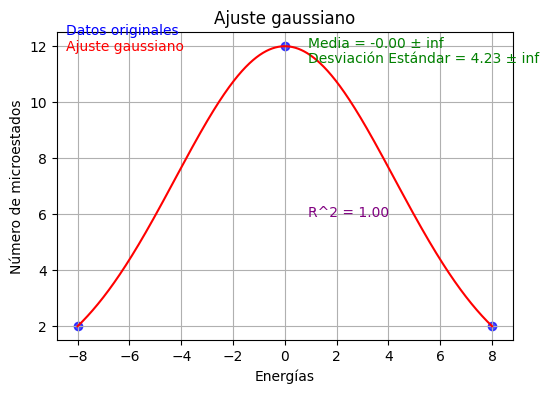

Valor media -2.9545650869737554e-16 $\pm$ inf 
Valor Desviacion Estandar 4.226054903765439 $\pm$ inf


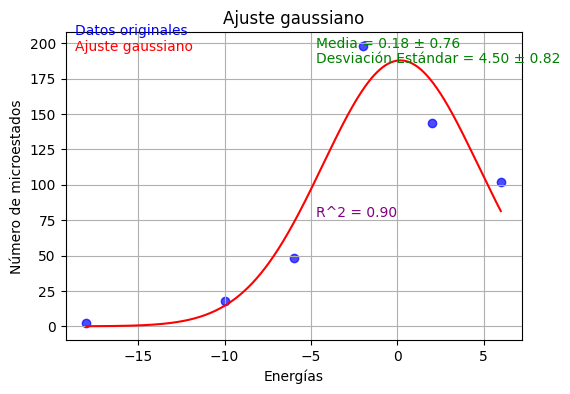

Valor media 0.1847514856408072 $\pm$ 0.7616832722066246 
Valor Desviacion Estandar 4.497454599195013 $\pm$ 0.8178389952882212


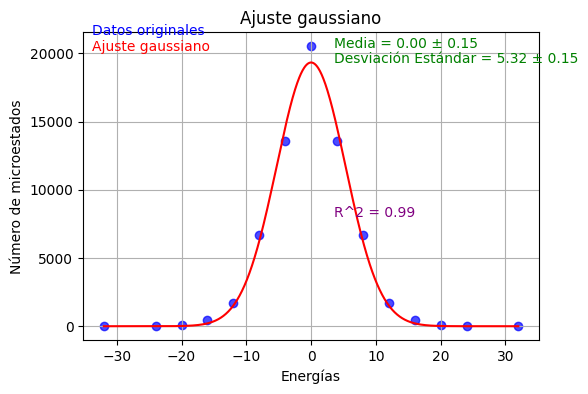

Valor media 8.854093443402735e-06 $\pm$ 0.1468659336816334 
Valor Desviacion Estandar 5.321386411928673 $\pm$ 0.1467749574179278


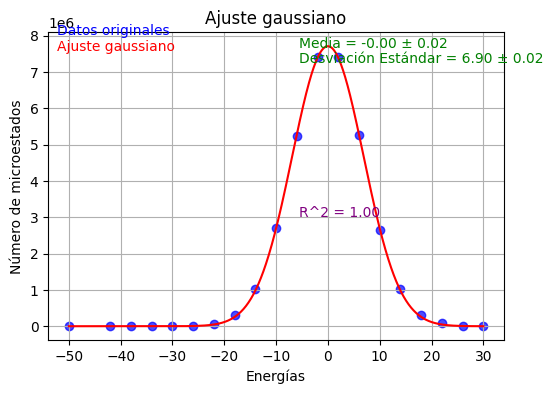

Valor media -0.00011355555661083451 $\pm$ 0.023779502600706375 
Valor Desviacion Estandar 6.897694671616557 $\pm$ 0.023786271414058164


In [7]:
plt.figure(figsize=(20,4))
plt.subplot(1,3,1)
ajuste_grafica(dicc2, energia2)

plt.figure(figsize=(20,4))
plt.subplot(1,3,2)
ajuste_grafica(dicc3, energia3)

plt.figure(figsize=(20,4))
plt.subplot(1,3,3)
ajuste_grafica(dicc4, energia4)


plt.figure(figsize=(20,4))
plt.subplot(1,3,3)
ajuste_grafica(dicc5, energia5)

## Parte 3: 
Con base en lo anterior demuestre la equivalencia entre la suma sobre estados de la función partición canónica y la suma sobre energías para un N dado y tres valores de $\beta$ tomando $K_\beta = 1$ con $T = 2, 2.5, 3$

$$Z(\beta) = \sum_{\sigma} exp(-\beta E(\sigma)) = \sum_{E} \Omega (E) exp(-\beta E)$$

In [8]:
# Sistema N = 2x2
T = [2, 2.5, 3.0] # Arrays de tiempo 

inicio1 = time.time() # Inicia conteo de tiempo
array1 = Z1_beta(T[0], energia2)
fin1 = time.time() # Finaliza el tiempo 
duracion1 = fin1 - inicio1  # Calcula el tiempo de computo 

inicio2 = time.time() 
array2 = Z2_beta(T[0], list(dicc2['Numero de Microestados']), list(dicc2['Energia']))  
fin2 = time.time()
duracion2 = fin2 - inicio2

print(f"La diferencia entre los valores de cada funcion particion es: {array2[-1] - array1[-1]}") 
print( "{:.100f}".format(duracion1))
print("{:.100f}".format(duracion2) )

La diferencia entre los valores de cada funcion particion es: 0.0
0.0010340213775634765625000000000000000000000000000000000000000000000000000000000000000000000000000000
0.0010151863098144531250000000000000000000000000000000000000000000000000000000000000000000000000000000


Como se evidencia en el calculo anterior, no hay mayor diferencia en el tiempo de computo para calcular la función partición con los dos métodos. Además, es suficiente un sistema $N = 2x2$ para demostrar la equivalencia numérica. 

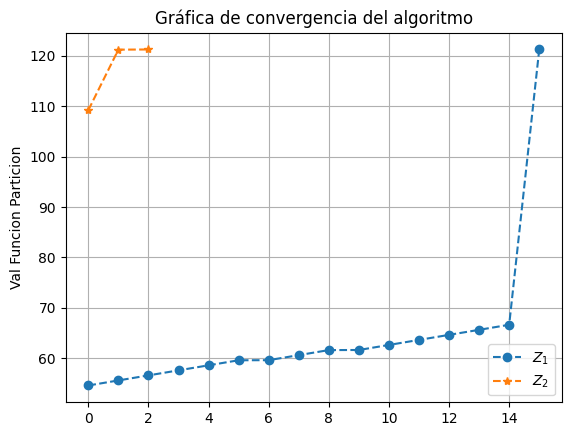

In [9]:
plt.title("Gráfica de convergencia del algoritmo")
plt.plot(array1, 'o--', label = '$Z_1$')
plt.plot(array2, '*--', label = '$Z _2$')
plt.ylabel('Val Funcion Particion')
plt.grid()
plt.legend()

Como se evidencia en la grafica anterior, la convergencia con $Z_1$ se alcanza después de 16 pasos, mientras que con la definición de $Z_2$ la convergencia del algoritmo se hace solo en 3 pasos. Numéricamente el valor final es igual. Veamos un caso más complejo para concluir con mayor precisión (sistema N = 4x4). 

In [10]:
# Para T = 2.0
inicio1_s4_T1 = time.time() # Inicia conteo de tiempo
array1_s4_T1 = Z1_beta(T[0], energia4)
fin1_s4_T1 = time.time() # Finaliza el tiempo 
duracion1_s4_T1 = fin1_s4_T1 - inicio1_s4_T1  # Calcula el tiempo de computo 

inicio2_s4_T1 = time.time() 
array2_s4_T1 = Z2_beta(T[0], list(dicc4['Numero de Microestados']), list(dicc4['Energia']))  
fin2_s4_T1 = time.time()
duracion2_s4_T1 = fin2_s4_T1 - inicio2_s4_T1

# Para T = 2.5
inicio1_s4_T2 = time.time() # Inicia conteo de tiempo
array1_s4_T2 = Z1_beta(T[1], energia4)
fin1_s4_T2 = time.time() # Finaliza el tiempo 
duracion1_s4_T2 = fin1_s4_T2 - inicio1_s4_T2  # Calcula el tiempo de computo 

inicio2_s4_T2 = time.time() 
array2_s4_T2 = Z2_beta(T[1], list(dicc4['Numero de Microestados']), list(dicc4['Energia']))  
fin2_s4_T2 = time.time()
duracion2_s4_T2 = fin2_s4_T2 - inicio2_s4_T2

# Para T = 3.0
inicio1_s4_T3 = time.time() # Inicia conteo de tiempo
array1_s4_T3 = Z1_beta(T[2], energia4)
fin1_s4_T3 = time.time() # Finaliza el tiempo 
duracion1_s4_T3 = fin1_s4_T3 - inicio1_s4_T3  # Calcula el tiempo de computo 

inicio2_s4_T3 = time.time() 
array2_s4_T3 = Z2_beta(T[2], list(dicc4['Numero de Microestados']), list(dicc4['Energia']))  
fin2_s4_T3 = time.time()
duracion2_s4_T3 = fin2_s4_T3 - inicio2_s4_T3

print("Sistema N = 4x4 Comprobación numérica")
print("-----"*30)
print(f"La diferencia entre los valores de cada funcion particion para un temperatura de {T[0]} K es: {array2_s4_T1[-1] - array1_s4_T1[-1]}")
print("Para Z1 el tiempo de computo es: ")
print( "{:.100f}".format(duracion1_s4_T1))
print("Para Z2 el tiempo de computo es: ")
print( "{:.100f}".format(duracion2_s4_T1))
print('+++++'*30)
print(f"La diferencia entre los valores de cada funcion particion para un temperatura de {T[1]} K es: {array2_s4_T2[-1] - array1_s4_T2[-1]}") 
print("Para Z1 el tiempo de computo es: ")
print( "{:.100f}".format(duracion1_s4_T2))
print("Para Z2 el tiempo de computo es: ")
print( "{:.100f}".format(duracion2_s4_T2))
print('+++++'*30)
print(f"La diferencia entre los valores de cada funcion particion para un temperatura de {T[2]} K es: {array2_s4_T3[-1] - array1_s4_T3[-1]}") 
print("Para Z1 el tiempo de computo es: ")
print( "{:.100f}".format(duracion1_s4_T3))
print("Para Z2 el tiempo de computo es: ")
print( "{:.100f}".format(duracion2_s4_T3))


Sistema N = 4x4 Comprobación numérica
------------------------------------------------------------------------------------------------------------------------------------------------------
La diferencia entre los valores de cada funcion particion para un temperatura de 2 K es: -1.7706304788589478e-05
Para Z1 el tiempo de computo es: 
0.2345576286315917968750000000000000000000000000000000000000000000000000000000000000000000000000000000
Para Z2 el tiempo de computo es: 
0.0000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
La diferencia entre los valores de cada funcion particion para un temperatura de 2.5 K es: -6.621703505516052e-07
Para Z1 el tiempo de computo es: 
0.2214806079864501953125000000000000000000000000000000000000000000000000000000000000000000000000000000
Para Z2 el tiempo de c

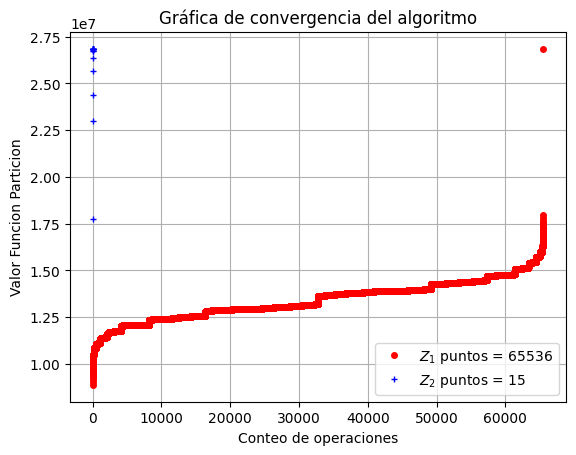

In [11]:
plt.title("Gráfica de convergencia del algoritmo")
plt.plot(array1_s4_T1, 'o', markersize = 4.0, color = 'red',  label = '$Z_1$ puntos = 65536')
plt.plot(array2_s4_T1, '+',  markersize = 5.0,color = 'blue',label = '$Z _2$ puntos = 15')
plt.ylabel('Valor Funcion Particion')
plt.xlabel('Conteo de operaciones')
plt.grid()
plt.legend()

## Punto 4: 

Para $N = 4x4$, haga un barrido sobre un amplio rango de valores de $\beta$, para obtener una gráfica de $<E>$ en función de $T$, usando $<E> = - \frac{\partial ln Z }{\partial \beta}$. Qué concluye? 


Tomando la expresión dada: 
$$ <E> = - \frac{\partial ln Z}{\partial \beta}  = - \frac{1}{Z} \frac{\partial Z}{\partial \beta}$$


Por otro lado: $Z = \sum_E \Omega(E)exp(-\beta E)$. Introduciendo esta expresion en la anterior es fácil obtener: 

$$<E> = \frac{\sum_E E \Omega(E) exp(-\beta E)}{ \sum_E \Omega(E) exp(-\beta E)}$$

Dado que $\beta = \frac{1}{K_\beta T }$ y por hipótesis $K_\beta = 1$, entonces $\beta = \frac{1}{T}$. La expresión a implementar será:

$$<E> = \frac{\sum_E E \Omega(E) exp(-\frac{E}{T})}{ \sum_E \Omega(E) exp(-\frac{E}{T})}$$

In [12]:
T = np.linspace(0.01, 10, 100)
valor_medio_E = [] 
for i in T: 
    valor_medio_E.append(meanE_T(i, list(dicc4['Numero de Microestados']), list(dicc4['Energia'])))

c:\Users\Lenovo\Desktop\curso_python\FISICA ESTADISTICA\codigoPython.py:292: RuntimeWarning: overflow encountered in exp
  up = energias[i] * num_microestados[i] * np.exp(- energias[i] / T)
c:\Users\Lenovo\Desktop\curso_python\FISICA ESTADISTICA\codigoPython.py:295: RuntimeWarning: overflow encountered in exp
  down = num_microestados[i] * np.exp(- energias[i] / T)
c:\Users\Lenovo\Desktop\curso_python\FISICA ESTADISTICA\codigoPython.py:301: RuntimeWarning: invalid value encountered in scalar divide
  return value_up/value_down


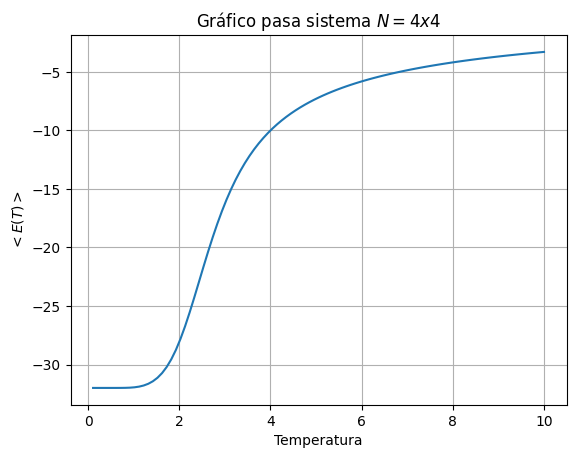

In [13]:
plt.plot(T, valor_medio_E)
plt.xlabel('Temperatura')
plt.ylabel('$<E(T)>$')
plt.title('Gráfico pasa sistema $N = 4x4$')
plt.grid()

## Punto 5: 
Demuestre numéricamente la siguiente relación vista en clase: 

$$\sum_E \Omega (E) exp(- \beta E) = \Omega (\bar E) exp(-\beta \bar E)$$

En este caso se intenta probar la expresión anterior de forma numérica, pero dado que solo es válida para el límite termodinámico no da resultados satisfactorios. La Ec. anterior trata de comprobar la parte izquierda a partir de un modelo construido del teorema del valor medio, el cual siempre asegura que hay un rectangulo con la misma área y ancho de la curva a comparar. 

In [74]:
T = 2
from collections import Counter 


def mult(diccionario, energia): 
    """
    Calcula la multiplicidad de la energia mas cercana a la energia promedio del sistema. 

    Argumentos: 
        diccionario (dict) -- un diccionario que contiene 'energia' y 'numero de microestados'
        energia (float) -- la energia promedio para la cual se busca la multiplicaidad cercana
    
    Retorna: 
        int -- la multiplicidad de la energia mas cercana a la energia promedio
    
    """
    # Encuentra el valor más cercano a la energía promedio en las energías del diccionario.
    valor_mas_cercano = float(min(list(diccionario['Energia']), key=lambda x: abs(x - meanE_T(T, list(diccionario['Numero de Microestados']), list(diccionario['Energia']))))) # Encuentro el valor mas cercano a la energia promedio en las energias de la red 2x2) 
    # Cuenta la frecuencia de la energía en el argumento 'energia'.
    cuenta = Counter(energia)
    # Convierte las claves (energías únicas) y valores (frecuencias) en arrays numpy.
    e1 = np.array(list(cuenta.keys()) ) 
    e2 = np.array(list(cuenta.values())) 
    # Encuentra el índice de la energía más cercana en el array de energías únicas.
    eval = np.where(e1 == valor_mas_cercano)
    # Obtiene la multiplicidad correspondiente a la energía más cercana.
    mult = e2[eval]
    return mult 



mult2 = mult(dicc2, energia2)
izq_2x2 = izq(T, list(dicc2['Numero de Microestados']), list(dicc2['Energia'])) 
der_2x2 = mult2 * np.exp(-(1/T)* meanE_T(T, list(dicc2['Numero de Microestados']), list(dicc2['Energia'])))
err2 = ((izq_2x2 - der_2x2 )/izq_2x2)*100

mult3 = mult(dicc3, energia3)
izq_3x3 = izq(T, list(dicc3['Numero de Microestados']), list(dicc3['Energia'])) 
der_3x3 = mult3 * np.exp(-(1/T)* meanE_T(T, list(dicc3['Numero de Microestados']), list(dicc3['Energia'])))
err3 = ((izq_3x3 - der_3x3 )/izq_3x3)*100


mult4 = mult(dicc4, energia4)
izq_4x4 = izq(T, list(dicc4['Numero de Microestados']), list(dicc4['Energia'])) 
der_4x4 = mult4 * np.exp(-(1/T)* meanE_T(T, list(dicc4['Numero de Microestados']), list(dicc4['Energia'])))
err4 = ((izq_4x4 - der_4x4 )/izq_4x4)*100


mult5 = mult(dicc5, energia5)
izq_5x5 = izq(T, list(dicc5['Numero de Microestados']), list(dicc5['Energia'])) 
der_5x5 = mult5 * np.exp(-(1/T)* meanE_T(T, list(dicc5['Numero de Microestados']), list(dicc5['Energia'])))
err5 = ((izq_5x5 - der_5x5 )/izq_5x5)*100

print(f'El error relativo porcentual para un sistema 2x2 en la expresion a probar es: {err2}')
print(f'El error relativo porcentual para un sistema 3x3 en la expresion a probar es: {err3}')
print(f'El error relativo porcentual para un sistema 4x4 en la expresion a probar es: {err4}')
print(f'El error relativo porcentual para un sistema 5x5 en la expresion a probar es: {err5}')

El error relativo porcentual para un sistema 2x2 en la expresion a probar es: [39.52353115]
El error relativo porcentual para un sistema 3x3 en la expresion a probar es: [72.12528259]
El error relativo porcentual para un sistema 4x4 en la expresion a probar es: [90.64423662]
El error relativo porcentual para un sistema 5x5 en la expresion a probar es: [42.45764192]


Realicemos esto apra un pull de temperaturas. 

## Punto #6: 

Implemente en su programa el calculo del calor especifico: 

$$C_V = \frac{\beta^2}{N} ( <E^2> - <E>^2)$$

Usando la definición de promedios en el ensamble canónico para obtener curvas del calor específico en función de la temperatura.

Valor maximo la capacidad calorifica para sistema red 4 es: 0.41477811751059124
Valor maximo la capacidad calorifica para sistema red 9 es: 0.6533119582693975
Valor maximo la capacidad calorifica para sistema red 16 es: 0.8164556373828824
Valor maximo la capacidad calorifica para sistema red 25 es: 0.9396098147486316
------------------------------------------------------------------------------------------
Temperatura de Curie para red 4 es: 2.5097980102502264
Temperatura de Curie para red 4 es: 2.4727110715081313
Temperatura de Curie para red 4 es: 2.4367042294746084
Temperatura de Curie para red 4 es: 2.4132766450864818
------------------------------------------------------------------------------------------


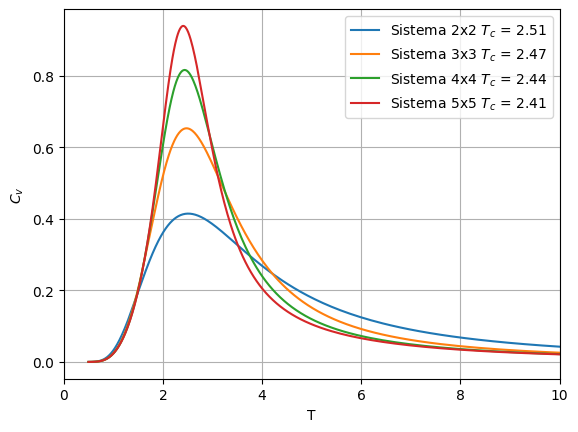

In [15]:
beta = np.linspace(0.01,2,1000)
T = 1/beta
# Calor especifico a volumen constante para sistema N = 2x2
N1 = 4
cv_2x2 = []
for i in T: 
    E1_2x2 = meanE_T(i, list(dicc2['Numero de Microestados']), list(dicc2['Energia'])) # Se toma el valor medio de la energia
    E2_2x2 = meanE_2(i, list(dicc2['Numero de Microestados']), list(dicc2['Energia'])) # Se toma la energia al cuadrado en valor medio
    cv_2x2.append((1/(i**2*N1)) * (E2_2x2 - E1_2x2**2)) # Se hace la operacion 

# Calor especifico a volumen constante para sistema N = 3x3
N2 = 9
cv_3x3 = []
for i in T: 
    E1_3x3 = meanE_T(i, list(dicc3['Numero de Microestados']), list(dicc3['Energia']))
    E2_3x3 = meanE_2(i, list(dicc3['Numero de Microestados']), list(dicc3['Energia']))
    cv_3x3.append((1/(i**2*N2)) * (E2_3x3 - E1_3x3**2))  

# Calor especifico a volumen constante para sistema N = 4x4
N3 = 16
cv_4x4 = []
for i in T: 
    E1_4x4 = meanE_T(i, list(dicc4['Numero de Microestados']), list(dicc4['Energia']))
    E2_4x4 = meanE_2(i, list(dicc4['Numero de Microestados']), list(dicc4['Energia']))
    cv_4x4.append((1/(i**2*N3)) * (E2_4x4 - E1_4x4**2))  

# Calor especifico a volumen constante para sistema N = 5x5
N4 = 25
cv_5x5 = []
for i in T: 
    E1_5x5 = meanE_T(i, list(dicc5['Numero de Microestados']), list(dicc5['Energia'])) 
    E2_5x5 = meanE_2(i, list(dicc5['Numero de Microestados']), list(dicc5['Energia']))
    cv_5x5.append((1/(i**2*N4)) * (E2_5x5 - E1_5x5**2)) 

print(f'Valor maximo la capacidad calorifica para sistema red {N1} es: {np.max(cv_2x2)}')
print(f'Valor maximo la capacidad calorifica para sistema red {N2} es: {np.max(cv_3x3)}')
print(f'Valor maximo la capacidad calorifica para sistema red {N3} es: {np.max(cv_4x4)}')
print(f'Valor maximo la capacidad calorifica para sistema red {N4} es: {np.max(cv_5x5)}')
print('---'*30)

t_2x2 = T[np.argmax(cv_2x2)]
t_3x3 = T[np.argmax(cv_3x3)]
t_4x4 = T[np.argmax(cv_4x4)]
t_5x5 = T[np.argmax(cv_5x5)]

print(f'Temperatura de Curie para red {N1} es: {t_2x2}')
print(f'Temperatura de Curie para red {N1} es: {t_3x3}')
print(f'Temperatura de Curie para red {N1} es: {t_4x4}')
print(f'Temperatura de Curie para red {N1} es: {t_5x5}')
print('---'*30)

plt.plot(T, cv_2x2, label= f'Sistema 2x2 $T_c$ = {t_2x2:.2f}')
plt.plot(T, cv_3x3, label= f'Sistema 3x3 $T_c$ = {t_3x3:.2f}')
plt.plot(T, cv_4x4, label= f'Sistema 4x4 $T_c$ = {t_4x4:.2f}')
plt.plot(T, cv_5x5, label= f'Sistema 5x5 $T_c$ = {t_5x5:.2f}')
plt.xlabel('T')
plt.ylabel('$C_v$')
plt.plot()
plt.grid()
plt.xlim(0,10)
plt.legend()